In [5]:
#Install dan import library yang dibutuhkan
!pip install -q face_recognition
!pip install -q fer
import matplotlib.pyplot as plt
from matplotlib.pyplot import imshow
import matplotlib.patches as patches
%matplotlib inline
import face_recognition
import numpy as np
from PIL import ImageDraw
import PIL.Image
from io import BytesIO
from fer import FER
import cv2
import operator
import time
from google.colab import files
from google.colab.patches import cv2_imshow
detector = FER()

In [21]:
#Upload foto wajah yang akan digunakan pada aplikasi face recognition
uploaded = files.upload()

Saving cipung.jpg to cipung.jpg


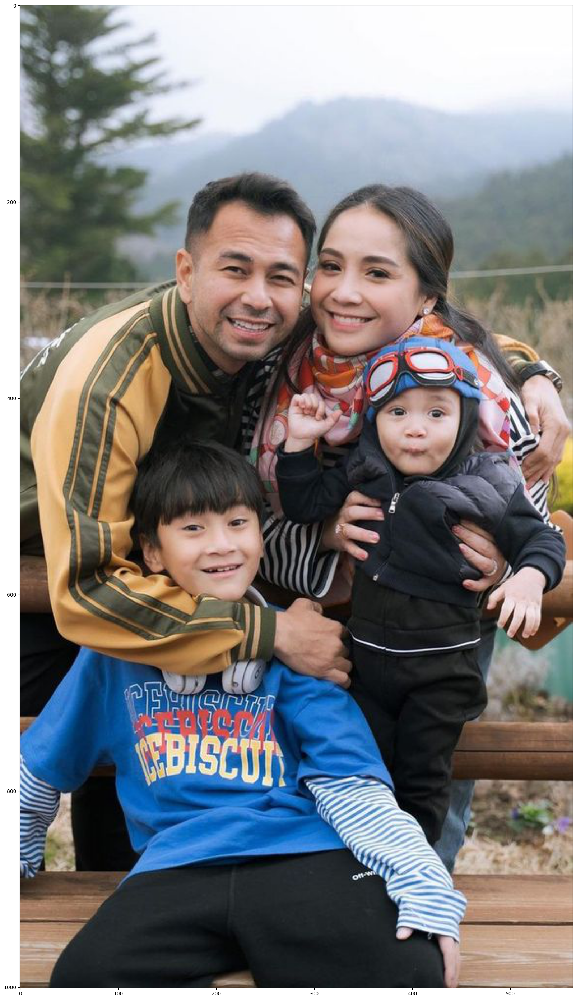

In [22]:
#Tampilkan foto yang sudah diupload sebelumnya
image = face_recognition.load_image_file(list(uploaded.keys())[0])
boundary = 24
im = PIL.Image.open(list(uploaded.keys())[0])
height = (im.size[1] / im.size[0]) * 20
fig=plt.subplots(figsize=(20,height))
imshow(im)

Number of faces: 4
Time taken: 0.39  seconds


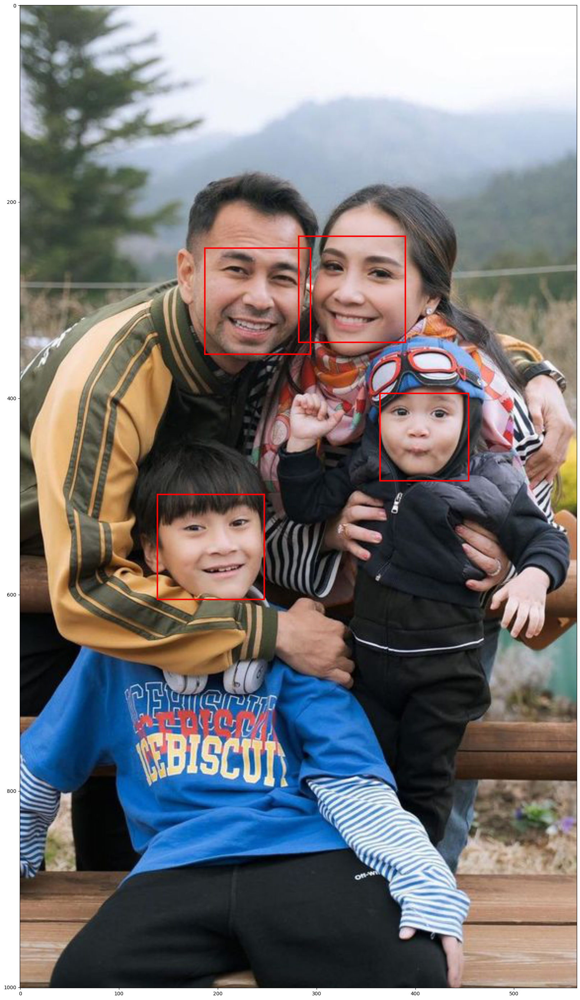

In [23]:
# Gunakan library face recognition dan gambar sebuah kotak merah yang mengelilingi wajah dari foto yang diupload
start = time.time()
face_locations = face_recognition.face_locations(image)
fig,ax = plt.subplots(figsize=(20,height))
for face_location in face_locations:
    top, right, bottom, left = face_location
    ax.imshow(im,aspect='auto')
    rect = patches.Rectangle((left,top), (right - left), (bottom-top),linewidth=3,edgecolor='r',facecolor='none')
    ax.add_patch(rect)
end = time.time()
print("Number of faces:",len(face_locations))
print("Time taken:",round(end-start,2)," seconds")

Number of faces: 4
Time taken: 0.963998556137085  seconds


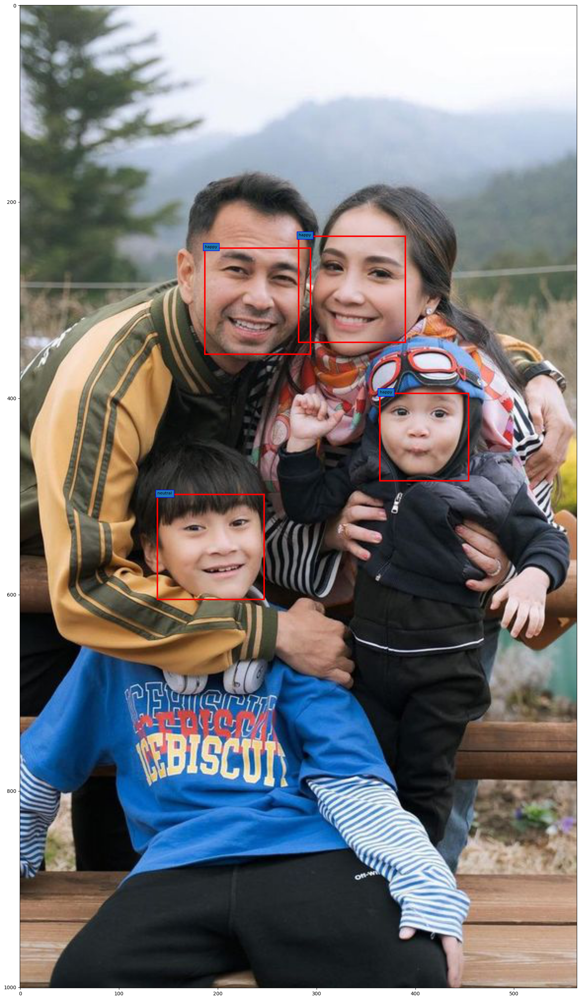

In [24]:
#Disini kita dapat memprediksi emosi dari setiap wajah yang ada dalam foto
start = time.time()
face_locations = face_recognition.face_locations(image)
fig,ax = plt.subplots(figsize=(20,height))
for face_location in face_locations:
    top, right, bottom, left = face_location
    ax.imshow(im,aspect='auto')
    rect = patches.Rectangle((left,top), (right - left), (bottom-top),linewidth=3,edgecolor='r',facecolor='none')
    ax.add_patch(rect)
    face_image = image[top-boundary:bottom+boundary, left-boundary:right+boundary]
    attribute = detector.detect_emotions(face_image)
    if (not attribute) == False:
      emotion = max(attribute[0]['emotions'].items(),key=operator.itemgetter(1))[0]
      #print(emotion)
      plt.text(left, top, emotion, fontsize=8, bbox=dict(fill=True, edgecolor='blue', linewidth=1))
end = time.time()
print("Number of faces:",len(face_locations))
print("Time taken:",end-start," seconds")

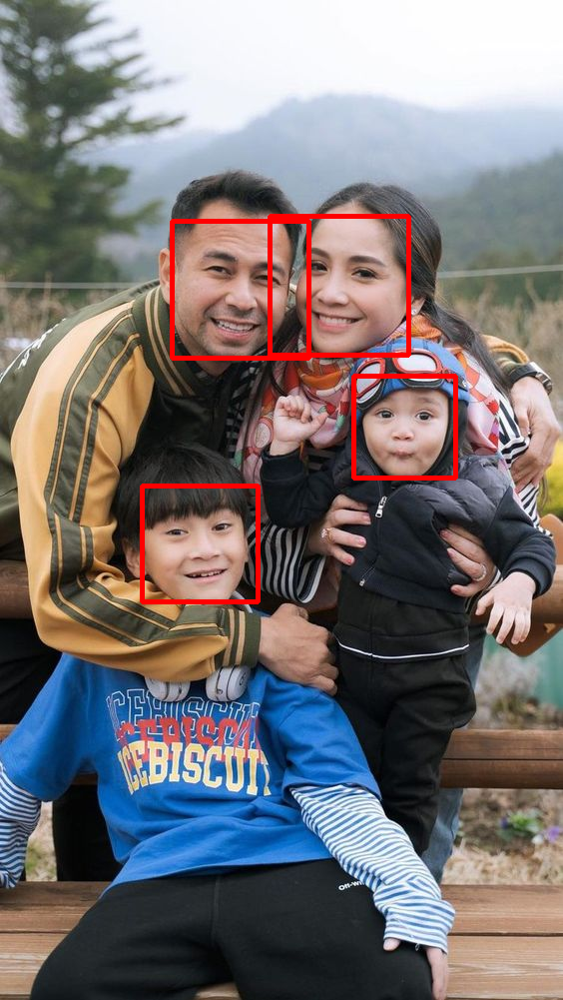

Time taken: 0.5461740493774414  seconds
Number of faces: 4


In [25]:
#Gunakan Haar Cascades yang merupakan sebuah algoritma deteksi objek yang digunakan untuk mendeteksi objek tertentu dalam gambar atau video
start = time.time()
#Load the cascade
face_cascade = cv2.CascadeClassifier(cv2.data.haarcascades + 'haarcascade_frontalface_default.xml')

#Read the input image
img = cv2.imread(list(uploaded.keys())[0])

#Convert into GrayScale
gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
#Detect Faces
faces = face_cascade.detectMultiScale(gray, 1.3, 4)
#Draw rectangle around each faces
for (x, y, w, h) in faces:
    cv2.rectangle(img, (x, y), (x + w, y + h), (0, 0, 255), 3)
#Display the output
ims = cv2.resize(img,(im.size[0],im.size[1]))
cv2_imshow(ims)
cv2.waitKey()
end = time.time()
print("Time taken:",end-start," seconds")
print("Number of faces:",len(faces))